# Package Import

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Part 1: Programming and Data Manipulation (Python)

## 1. Data Cleaning and Preparation

### 1.1 Data Upload and Inspection

In [2]:
# read the example csv file
example_df = pd.read_csv("data/manipulation_data.csv")
# show the first 3 rows for inspection
example_df.head(3)

,ID,Name,Date_of_Birth,Salary,Department
0,1.0,John Doe,1985-10-12,50000,Finance
1,2.0,Jane Smith,not_available,62000,Marketing
2,3.0,Emily Jones,1990-04-15,70000,Engineering


In [3]:
example_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             19 non-null     float64
 1   Name           20 non-null     object 
 2   Date_of_Birth  19 non-null     object 
 3   Salary         18 non-null     object 
 4   Department     20 non-null     object 
dtypes: float64(1), object(4)
memory usage: 932.0+ bytes


### 1.2 Identfy problems

After inspection, I found the following problems:
- inconsistant data format
- missing values
- wrong inputs
- wrong data types

### 1.3 Problems handling

### 1.3.1 inconsistant data format

In [4]:
# standardize missing values formate
for col, wrng_format, corr_format in zip(['Salary', 'Department'],
                                         [['not_applicable', 'not_available'], 'not_specified'],
                                         [np.nan, 'Unknown']):
    try:
        example_df[col] = example_df[col].replace(wrng_format, corr_format)
    except KeyError:
        print(f"column {col} is not in the provided df please check for spelling")


In [5]:
# standardize the date column and also convert to date-time object 
example_df['Date_of_Birth'] = pd.to_datetime(example_df['Date_of_Birth'], errors='coerce', format='%Y-%m-%d')

### 1.3.2 wrong data types

As we can see from the information displayed below there is wrong data types and we will attempt to deal with this by
converting columns to the correct data types. for example:  
- The `ID` column is a `float64` which takes a lot of memory meanwhile the ID column itself ranges from (0 to 19). so, maybe an `int8` is more suitable and more memory efficient. Of course, the data type may vary according to the **data range** and **expected range** but for this demo, we will move on with `int8`
- The `Salary` column is an object type and needs to be converted to a numeric type maybe `float64`

In [6]:
example_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   ID             19 non-null     float64       
 1   Name           20 non-null     object        
 2   Date_of_Birth  16 non-null     datetime64[ns]
 3   Salary         16 non-null     object        
 4   Department     20 non-null     object        
dtypes: datetime64[ns](1), float64(1), object(3)
memory usage: 932.0+ bytes


In [7]:
# convert to numeric values
example_df['Salary'] = pd.to_numeric(example_df['Salary'], errors='coerce')

we will handle the data type of the `ID` column after dealing with the missing values problem because it contains `np.nan` which is a large float number and that is what makes the column's datatype `float64`

In [8]:
# make sure that the data types are as expected.
example_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   ID             19 non-null     float64       
 1   Name           20 non-null     object        
 2   Date_of_Birth  16 non-null     datetime64[ns]
 3   Salary         16 non-null     float64       
 4   Department     20 non-null     object        
dtypes: datetime64[ns](1), float64(2), object(2)
memory usage: 932.0+ bytes


### 1.3.3 Wrong inputs  
We can see a negative value in the `Salary` column which does not make sense and is most probably a mistake.  
so we will ensure that all the values in the `Salary` column are absolute.

In [9]:
# the target row
example_df.iloc[14]

ID                              15.0
Name                    Victor Stone
Date_of_Birth    1989-11-15 00:00:00
Salary                      -45000.0
Department                 Marketing
Name: 14, dtype: object

In [10]:
# make sure every value is absolute
example_df['Salary'] = example_df['Salary'].abs()

In [11]:
# check after correction
example_df.iloc[14]

ID                              15.0
Name                    Victor Stone
Date_of_Birth    1989-11-15 00:00:00
Salary                       45000.0
Department                 Marketing
Name: 14, dtype: object

### 1.3.4 missing values

We can see from the information displayed above that we have 9 missing values from `3` different columns which are:  
- ID --> 1 missing values
- Date_of_Birth --> 4 missing values
- Salary --> 4 missing values

Strategy for handling missing values:  
- `ID` --> With only one data missing and the nature of the `ID` column (just a serial of numbers starting from 1 to number of employees) we will just insert the missing data to fit the serial.
- `Date_of_Birth` --> The missing values will be left as is because this column is irrelevant to analysis to be performed. I did not choose to remove the rows that contain the missing values because I do not have much data.
- `Salary` --> With 4 missing values I think it's best to fill the missing values by the average salary per department. I think this will give a good approximation to missing salary values as the employees in the same department have the same range of salary.

In [12]:
example_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   ID             19 non-null     float64       
 1   Name           20 non-null     object        
 2   Date_of_Birth  16 non-null     datetime64[ns]
 3   Salary         16 non-null     float64       
 4   Department     20 non-null     object        
dtypes: datetime64[ns](1), float64(2), object(2)
memory usage: 932.0+ bytes


In [13]:
example_df.isna().sum()

ID               1
Name             0
Date_of_Birth    4
Salary           4
Department       0
dtype: int64

In [14]:
# missing value for Id column
example_df.loc[4, "ID"] = 4
# change the data type of the column
example_df['ID'] = pd.to_numeric(example_df["ID"], downcast='integer')

In [15]:
example_df.isna().sum()

ID               0
Name             0
Date_of_Birth    4
Salary           4
Department       0
dtype: int64

In [16]:
# missing values for the salary column
# identfy the department that contains the missing values
example_df[example_df['Salary'].isna()]['Department']

4         Sales
10        Sales
17        Sales
19    Marketing
Name: Department, dtype: object

In [17]:
# show the salaries of the marketing and sales departments
example_df[example_df['Department'].isin(['Marketing', 'Sales'])][['Salary', 'Department']]

,Salary,Department
1,62000.0,Marketing
4,NaN,Sales
7,31000.0,Marketing
10,NaN,Sales
14,45000.0,Marketing
17,NaN,Sales
19,NaN,Marketing


now that we see that all salary values for the `Sales` department are missing, we can no longer use the average salary per department strategy. instead, we will use the total average of salaries for the missing values for the sales department 

In [18]:
# now that we know that the 2 department with the missing values are "Sales" and "Marketing"
# let's compute the avg salary for these 2 department
avg_sales_salary = example_df['Salary'].mean()
avg_marketing_salary = example_df[example_df['Department'] == 'Marketing']['Salary'].mean()

In [19]:
avg_sales_salary

np.float64(260625.0)

In [20]:
avg_marketing_salary

np.float64(46000.0)

In [21]:
# fill the misssing values
for depart, val in zip(['Sales', 'Marketing'], [avg_sales_salary, avg_marketing_salary]):
    example_df.loc[example_df['Department'] == depart, 'Salary'] = example_df.loc[example_df['Department'] == depart, 'Salary'].fillna(val)

In [22]:
# check that there is no missing values but date of birth column
example_df.isna().sum()

ID               0
Name             0
Date_of_Birth    4
Salary           0
Department       0
dtype: int64

### 1.3.5 Further inspection  
now that we have dealt with all visible problems let's investigate more to see if there are other hidden problems like outliers and deal with them.

In [23]:
example_df.describe()

,ID,Date_of_Birth,Salary
count,20.000000,16,2.000000e+01
mean,10.450000,1983-06-20 00:00:00,2.498938e+05
min,1.000000,1975-02-20 00:00:00,3.100000e+04
25%,5.500000,1980-06-15 06:00:00,5.150000e+04
50%,10.500000,1983-08-30 12:00:00,6.750000e+04
75%,15.250000,1986-06-19 12:00:00,2.606250e+05
max,20.000000,1990-04-15 00:00:00,1.200000e+06
std,5.968999,NaN,3.896987e+05


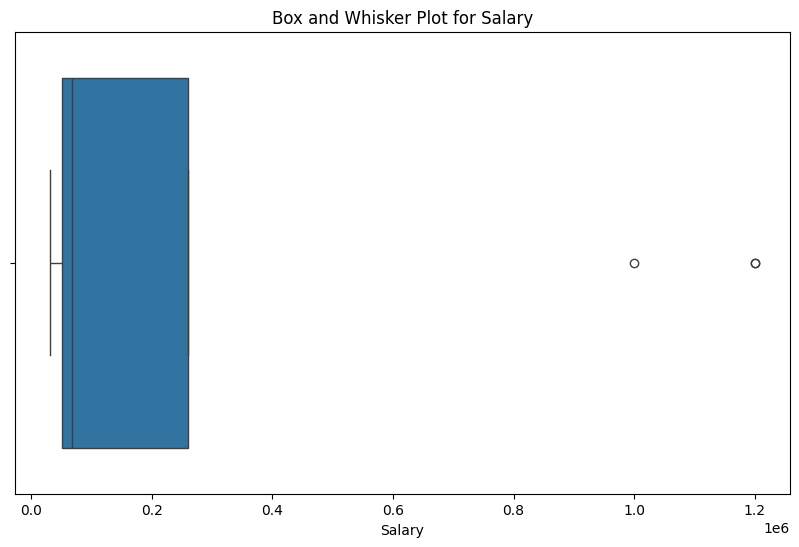

In [24]:
# plot a box plot to see if there is an outliers or not
plt.figure(figsize=(10, 6))
sns.boxplot(x=example_df['Salary'])
plt.title('Box and Whisker Plot for Salary')
plt.xlabel('Salary')
plt.show()

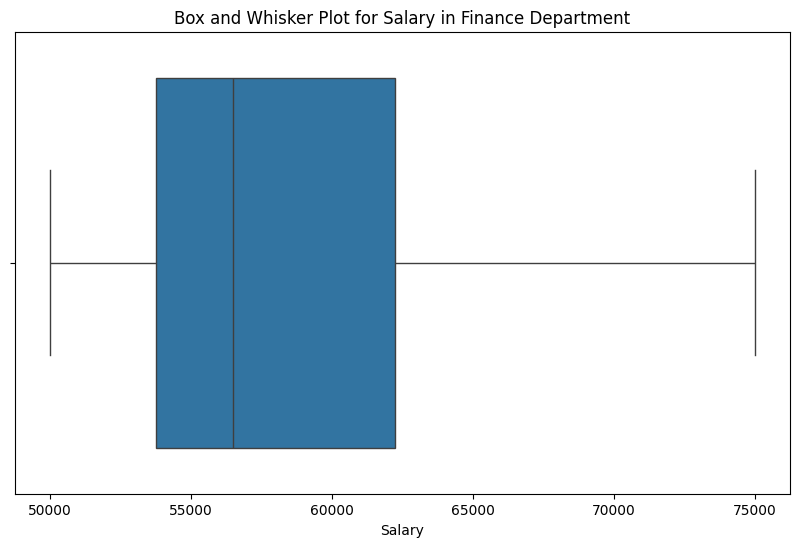

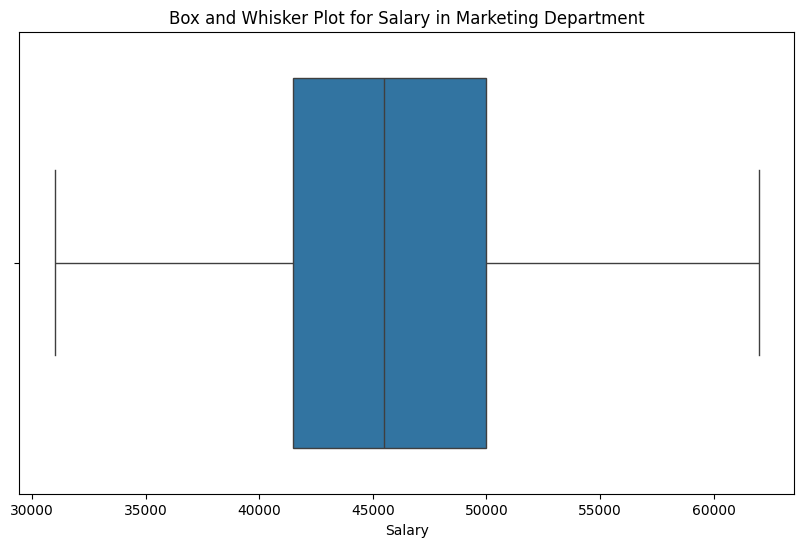

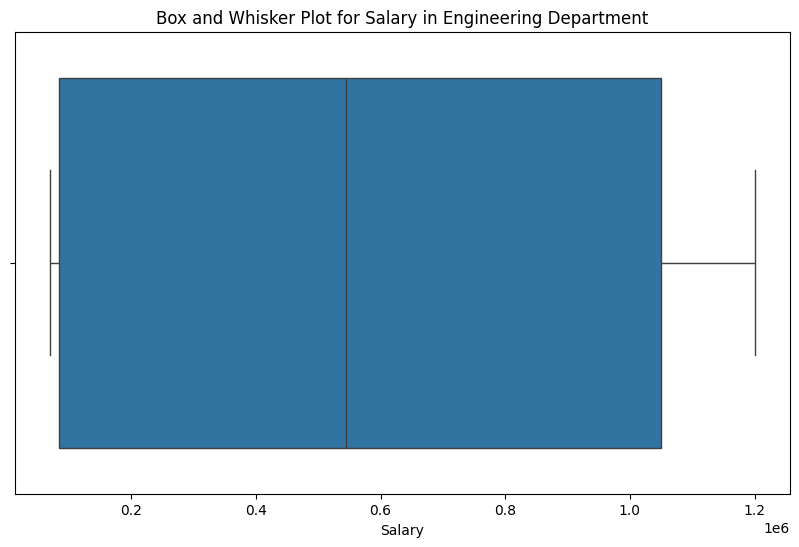

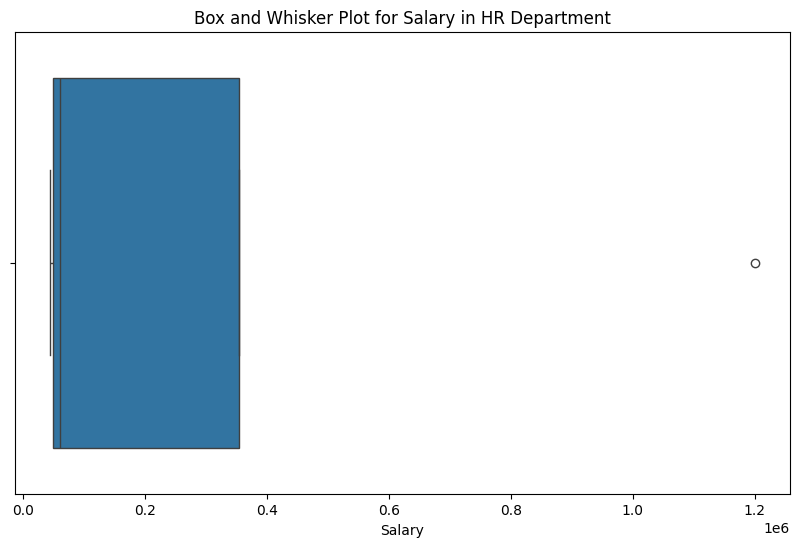

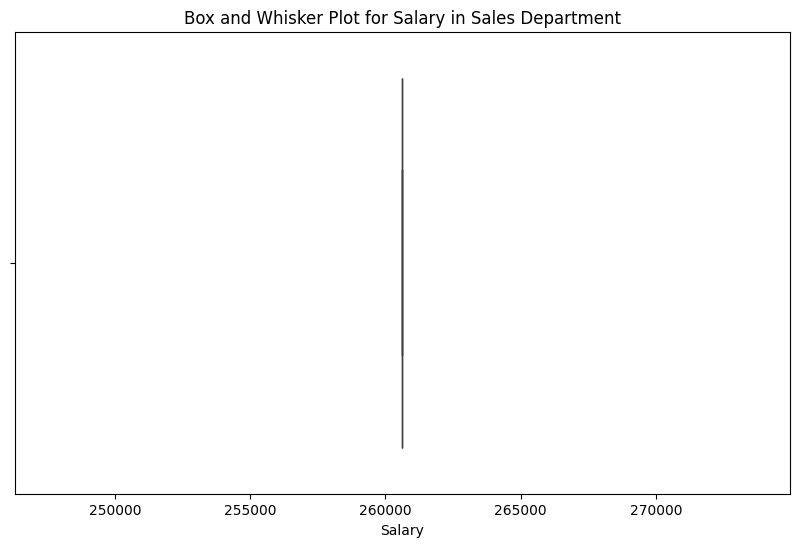

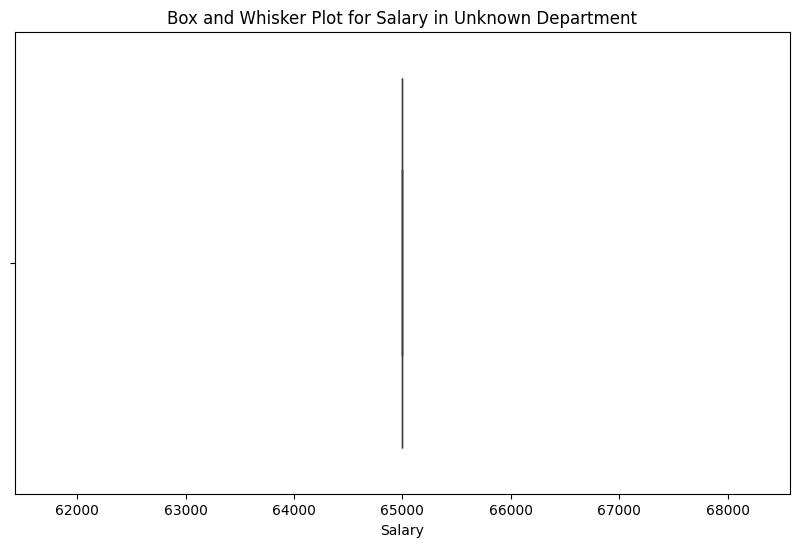

In [25]:
# plot a box plot to see if there is an outliers or not for salary per department
# Create the box and whisker plots for Salary per Department
# List of unique departments
departments = example_df['Department'].unique()

# Create separate box plots for each department
for department in departments:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=example_df[example_df['Department'] == department]['Salary'])
    plt.title(f'Box and Whisker Plot for Salary in {department} Department')
    plt.xlabel('Salary')
    plt.show()

from the two types of plots above we can see that there are two values far away from other data points. specifically in the HR and engineering departments.
all other departments do not seem to have outliers.

In [26]:
# let's inspect the number of data points that are outliers
example_df[example_df['Salary'] >= 1000000]

,ID,Name,Date_of_Birth,Salary,Department
6,7,Lily Evans,NaT,1200000.0,HR
11,12,Barry Allen,NaT,1000000.0,Engineering
18,19,Oliver Queen,1982-09-20,1200000.0,Engineering


three points are considered outliers because there is not much data in this data set I chose to deal with these outliers by capping them to the max value in each department and saving them rather than just removing them.

In [27]:
for depart in ['HR', 'Engineering']:
    # get the max values of each department excluding the outliers values
    max_val = example_df[(example_df['Department'] == depart) & (example_df['Salary'] < 1000000)]['Salary'].max()
    
    # Cap the salary at max_val for outliers in the department
    example_df.loc[(example_df['Department'] == depart) & (example_df['Salary'] >= 1000000), 'Salary'] = max_val


Now that we have processed and cleaned the example data let's save it and move to part number 2

In [28]:
example_df.to_csv("data/manipulation_data_cleaned.csv")

## 2. Data Analysis and Aggregation

### 2.1 Calculate the average salary per department

In [29]:
avg_per_depart = example_df.groupby("Department")["Salary"].mean()
avg_per_depart

Department
Engineering     85000.0
Finance         59500.0
HR              60250.0
Marketing       46000.0
Sales          260625.0
Unknown         65000.0
Name: Salary, dtype: float64

### 2.1 Find the top 3 highest paid employees

In [30]:
top_3_paid_empl = example_df.nlargest(3, 'Salary')
top_3_paid_empl

,ID,Name,Date_of_Birth,Salary,Department
4,4,Sarah Davis,1988-08-25,260625.0,Sales
10,11,Diana Prince,1984-05-19,260625.0,Sales
17,18,Selina Kyle,1985-06-07,260625.0,Sales


### 2.1 Determine the number of employees in each department

In [31]:
employee_count_df = example_df['Department'].value_counts()
employee_count_df

Department
Finance        4
Marketing      4
Engineering    4
HR             4
Sales          3
Unknown        1
Name: count, dtype: int64

## 3. API utilization

See `data_manipulation_and_API.py`

# Part 2: Statistical Analysis

### 2.1 Regression Analysis

#### Package Import

In [32]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

In [33]:
# read the data 
house_df = pd.read_csv("data/regression_data.csv")
house_df.head(5)

,Size,Bedrooms,Location,Price
0,2000,3,Urban,500000
1,1500,2,Suburban,350000
2,2500,4,Urban,750000
3,1800,3,Rural,200000
4,2200,3,Suburban,450000


### Data inspection

In [34]:
house_df.describe()

,Size,Bedrooms,Price
count,20.000000,20.000000,20.000000
mean,1990.000000,3.050000,448500.000000
std,342.052628,0.887041,174334.071314
min,1500.000000,2.000000,200000.000000
25%,1700.000000,2.000000,337500.000000
50%,1950.000000,3.000000,405000.000000
75%,2262.500000,4.000000,542500.000000
max,2600.000000,5.000000,800000.000000


In [35]:
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Size       20 non-null     int64 
 1    Bedrooms  20 non-null     int64 
 2    Location  20 non-null     object
 3    Price     20 non-null     int64 
dtypes: int64(3), object(1)
memory usage: 772.0+ bytes


In [36]:
house_df.columns

Index(['Size', ' Bedrooms', ' Location', ' Price'], dtype='object')

we can see that column's names have white spacing which can be misleading when accessing columns, we will remove this white space and rename the columns

In [37]:
house_df.columns = house_df.columns.str.strip()

### Bulding the linear regression model

In [38]:
# Prepare the data
X = house_df[['Size', 'Bedrooms', 'Location']]
X = pd.get_dummies(X, columns=['Location'], drop_first=True)
y = house_df['Price']

In [39]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [40]:
# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [41]:
# Make predictions
y_pred = model.predict(X_test)

In [42]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 808899793.2731997


In [43]:
# Display coefficients
print("Coefficients:", model.coef_)
print("Intercept:", model.intercept_)

Coefficients: [8.94252243e+01 9.61129178e+04 2.16685212e+05 2.90097428e+05]
Intercept: -211600.12537754374


### Further Steps
####  More Complex Solution

In more complex situations, such as when dealing with larger datasets, more features, or more sophisticated models, more complex steps are required:

- Data Preprocessing: Handling missing values, scaling features, encoding categorical variables, and more complex feature engineering. we may use a `ColumnTransformer` that standardizes numerical features such as `Size` and one-hot encodes categorical features such as `Location`.
- Pipeline: Ensures consistent application of preprocessing steps and model fitting, simplifies code and reduces the risk of data leakage.
- Cross-Validation: Provides a more reliable estimate of model performance, especially with imbalanced datasets or when overfitting is a concern.
- Hyperparameter Tuning: Essential for optimizing more complex models like Random Forests, Gradient Boosting, or Neural Networks, where numerous hyperparameters significantly impact performance. Utilize RandomizedSearchCV and GridSearchCV to find the best hyperparameters, even though Linear Regression typically has few tunable parameters. This approach demonstrates how to optimize hyperparameters in more complex models.
- Model Evaluation: Involves additional metrics, such as R-squared, adjusted R-squared, mean absolute error (MAE), and more, to provide a comprehensive understanding of model performance. evaluates the model using cross-validation and further refines the model with hyperparameter tuning before final evaluation on the test set.

# Part 3: Data Visualization

## 3.1 Dashboard Creation

![Alt Text](media/DashBoard.png)

## 3.2 Interactive Visualization

I will be using an earthquake data set, The dataset represents global earthquake occurrences recorded over one year from January 1, 2023, to December 31, 2023. It includes detailed information about each earthquake event, such as its date, location, magnitude, and depth.

# Import Package

In [44]:
import plotly.express as px

In [45]:
# Load the dataset
earth_df = pd.read_csv('data/earthquake.csv')
earth_df.head(3)

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-01-01T01:41:43.755Z,7.1397,126.7380,79.194,4.5,mb,32.0,104.0,1.152,0.47,...,2023-03-11T22:51:45.040Z,"23 km ESE of Manay, Philippines",earthquake,5.51,7.445,0.083,43.0,reviewed,us,us
1,2023-01-01T03:16:14.442Z,-6.7065,155.2320,35.000,5.4,mww,130.0,36.0,3.946,0.68,...,2023-03-11T22:51:29.040Z,"51 km SSW of Panguna, Papua New Guinea",earthquake,8.95,1.770,0.098,10.0,reviewed,us,us
2,2023-01-01T05:27:09.979Z,17.4535,93.4248,39.850,4.7,mb,45.0,85.0,3.459,0.50,...,2023-03-11T22:51:29.040Z,"157 km WNW of Pathein, Myanmar",earthquake,8.67,7.199,0.097,33.0,reviewed,us,us


In [46]:
earth_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7651 entries, 0 to 7650
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time             7651 non-null   object 
 1   latitude         7651 non-null   float64
 2   longitude        7651 non-null   float64
 3   depth            7651 non-null   float64
 4   mag              7651 non-null   float64
 5   magType          7651 non-null   object 
 6   nst              7621 non-null   float64
 7   gap              7621 non-null   float64
 8   dmin             7618 non-null   float64
 9   rms              7651 non-null   float64
 10  net              7651 non-null   object 
 11  id               7651 non-null   object 
 12  updated          7651 non-null   object 
 13  place            7651 non-null   object 
 14  type             7651 non-null   object 
 15  horizontalError  7620 non-null   float64
 16  depthError       7651 non-null   float64
 17  magError      

In [47]:
# Convert the time column to DateTime
earth_df['time'] = pd.to_datetime(earth_df['time'])

# Extract year and month from the time column
earth_df['year_month'] = earth_df['time'].dt.to_period('M')

C:\Users\mouss\AppData\Local\Temp\ipykernel_13776\4029588375.py:5: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  earth_df['year_month'] = earth_df['time'].dt.to_period('M')


## 3.2.1 Map Plot

This map plot visualizes the locations of earthquakes around the world. Each point represents an earthquake, with its size and color corresponding to the earthquake's magnitude. The interactive map allows users to explore the geographical distribution and intensity of seismic activities globally.

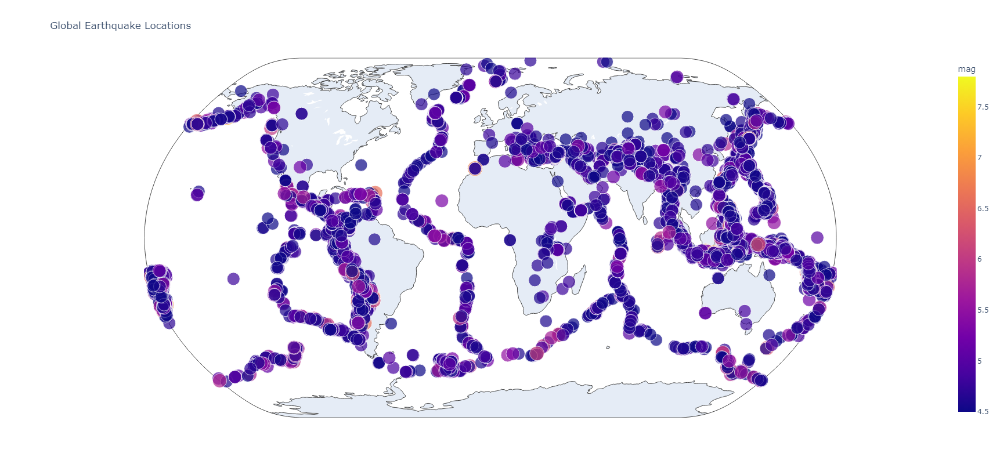

In [48]:
# Map Plot
fig = px.scatter_geo(earth_df, lat='latitude', lon='longitude', hover_name='place',
                     size='mag', color='mag', projection='natural earth', 
                     title='Global Earthquake Locations')

# Update layout to increase the figure size
fig.update_layout(
    autosize=False,
    width=1200,
    height=800,
)

fig.show()

## 3.2.2 Scatter Plot

This scatter plot shows the relationship between the magnitude and depth of earthquakes. Each point represents an earthquake, with the size of the point indicating the earthquake's magnitude and the color representing its location. The plot allows users to examine how earthquake magnitudes vary with depth.

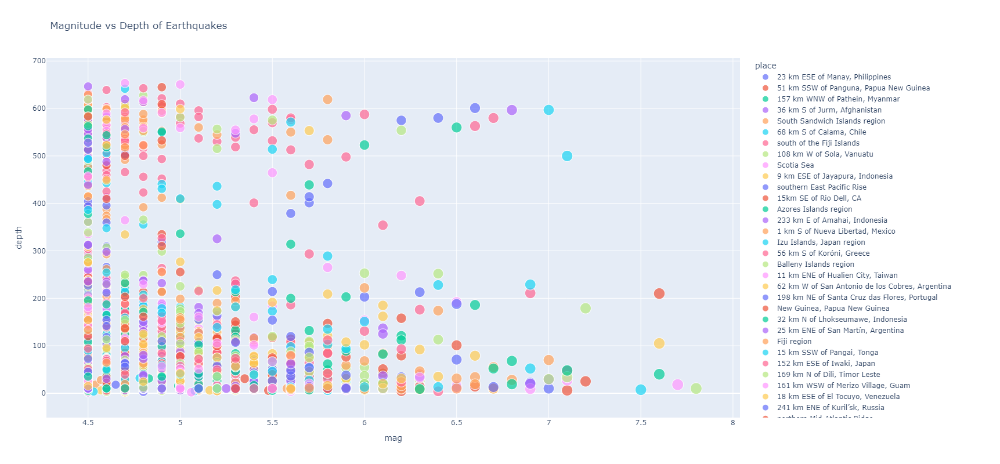

In [49]:
# Scatter Plot
fig = px.scatter(earth_df, x='mag', y='depth', color='place',
                 size='mag', hover_data=['place'],
                 title='Magnitude vs Depth of Earthquakes')

fig.update_layout(
    autosize=False,
    width=1200,
    height=800,
)

fig.show()


## 3.2.3 LinePlot 

This line plot displays the number of earthquakes recorded each month over a specified period. The x-axis represents the months, while the y-axis shows the number of earthquakes. This plot helps in identifying trends and patterns in earthquake frequency over time.

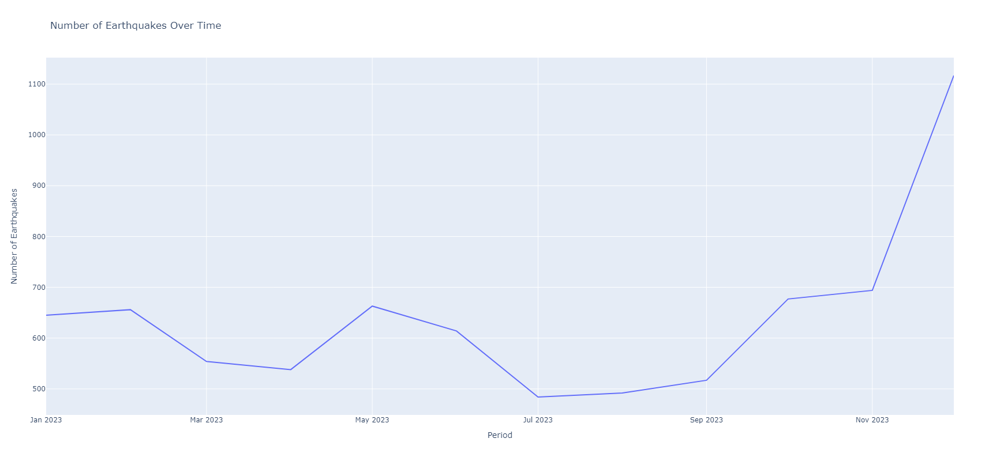

In [50]:
# Count the number of earthquakes per year-month
earthquake_counts = earth_df['year_month'].value_counts().sort_index()

# Time Series Plot
fig = px.line(earthquake_counts, x=earthquake_counts.index.astype(str), y=earthquake_counts.values,
              labels={'x': 'Period', 'y': 'Number of Earthquakes'},
              title='Number of Earthquakes Over Time')
fig.update_layout(
    autosize=False,
    width=1200,
    height=800,
)

fig.show()
